# Programming Project #1: Hybrid Images

## CS445: Computational Photography

### Part I: Hybrid Images

In [1]:
# Optional, if using Google Colab w/ Drive
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)



In [1]:
import cv2

import numpy as np
from matplotlib.colors import LogNorm
from scipy import signal

# modify to where you store your project data including utils.py
datadir = "./data/" 

utilfn = datadir + "utils.py"
!cp "$utilfn" .
import utils

In [2]:
# switch from notebook to inline if using colab or otherwise cannot use interactive display)
%matplotlib notebook  
import matplotlib.pyplot as plt

In [70]:
im1_file = datadir + 'biden.jpg'
im2_file = datadir + 'trump.jpg'

im1 = np.float32(cv2.imread(im1_file, cv2.IMREAD_GRAYSCALE) / 255.0)
im2 = np.float32(cv2.imread(im2_file, cv2.IMREAD_GRAYSCALE) / 255.0)

In [74]:
pts_im1 = utils.prompt_eye_selection(im1)
# pts_im1 = np.array([[607, 290], [748, 370]]) # uncomment if entering [x, y] pts manually
# plt.plot(pts_im1[:,0], pts_im1[:,1], 'r-+')

<IPython.core.display.Javascript object>

In [75]:
pts_im2 = utils.prompt_eye_selection(im2)
# pts_im2 = np.array([[299,343], [439,331]]) # uncomment if entering [x, y] pts manually
# plt.plot(pts_im2[:,0], pts_im2[:,1], 'r-+')

<IPython.core.display.Javascript object>

In [76]:
im1, im2 = utils.align_images(im1_file, im2_file,pts_im1,pts_im2,save_images=False)


In [77]:
# convert to grayscale
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) / 255.0
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) / 255.0

<IPython.core.display.Javascript object>


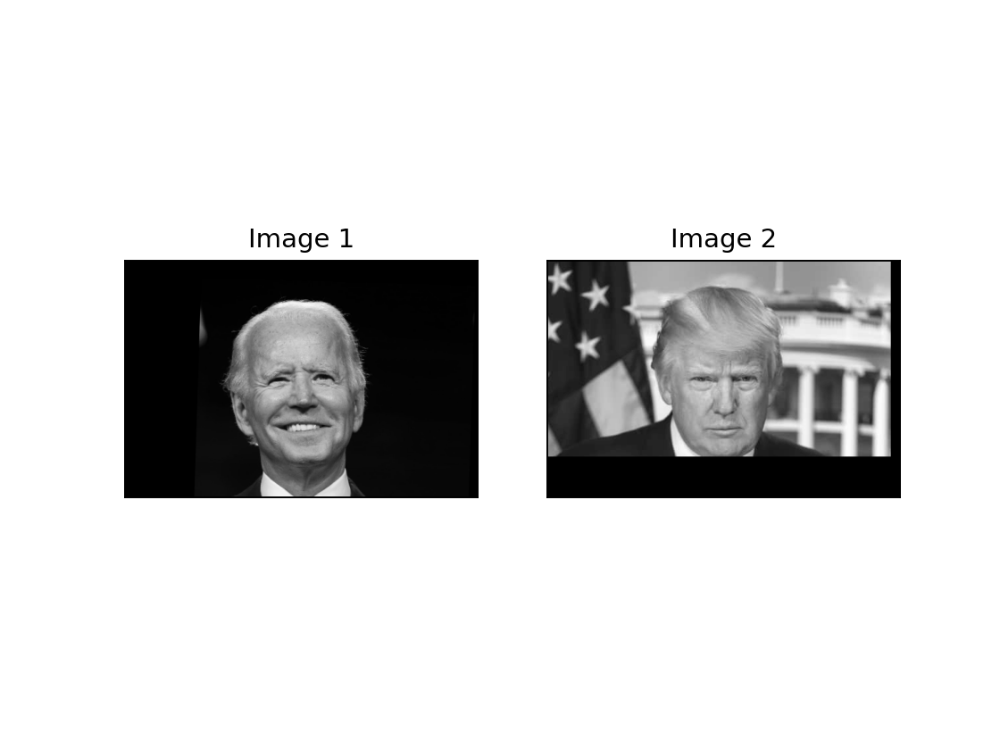

In [78]:
#Images sanity check
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im1,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [92]:
def hybridImage(im1, im2, sigma_low, sigma_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        sigma_low: standard deviation for the low-pass filter
        sigma_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''  

    # your code goes here  
    lowp_kernel = utils.gaussian_kernel(sigma_low, 3*sigma_low)
    highp_kernel = utils.gaussian_kernel(sigma_high, 3*sigma_high)
    
    lowp_filer = signal.convolve2d(im1, lowp_kernel, boundary='symm', mode='same')
    highp_filer = signal.convolve2d(im2, highp_kernel, boundary='symm', mode='same')
    res = highp_filer + lowp_filer
    
    print("im1:")
    plt.figure()
    plt.imshow(im1, cmap='gray')
    plt.savefig('report/im1.png')
    plt.figure()
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1)))))
    plt.savefig('report/im1_fft.png')
    plt.figure()
    plt.imshow(lowp_filer, cmap='gray')
    plt.savefig('report/im1_fil.png')
    plt.figure()
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(lowp_filer)))))
    plt.savefig('report/im1_fil_fft.png')
    
    print("im2:")
    plt.figure()
    plt.imshow(im2, cmap='gray')
    plt.savefig('report/im2.png')
    plt.figure()
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2)))))
    plt.savefig('report/im2_fft.png')
    plt.figure()
    plt.imshow(highp_filer, cmap='gray')
    plt.savefig('report/im2_fil.png')
    plt.figure()
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(highp_filer)))))
    plt.savefig('report/im2_fil_fft.png')

    print("hybrid:")
    plt.figure()
    plt.imshow(res, cmap='gray')
    plt.savefig('report/hybrid.png')
    plt.figure()
    plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(res)))))
    plt.savefig('report/hybrid_fft.png')
    
    return res

im1:


<IPython.core.display.Javascript object>


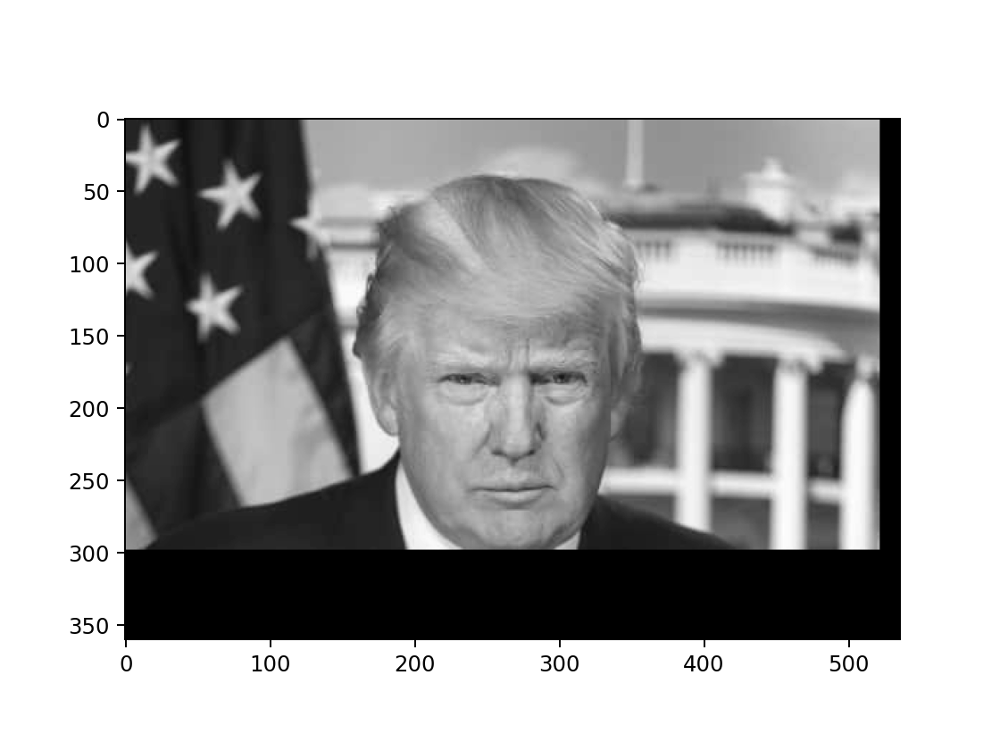

<IPython.core.display.Javascript object>


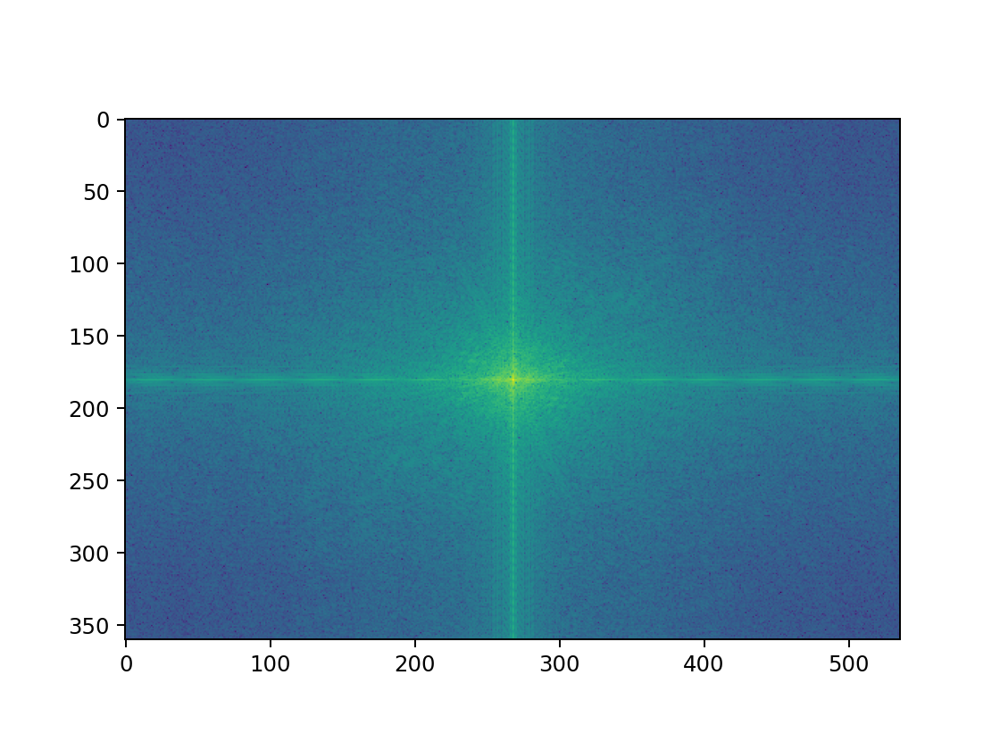

<IPython.core.display.Javascript object>


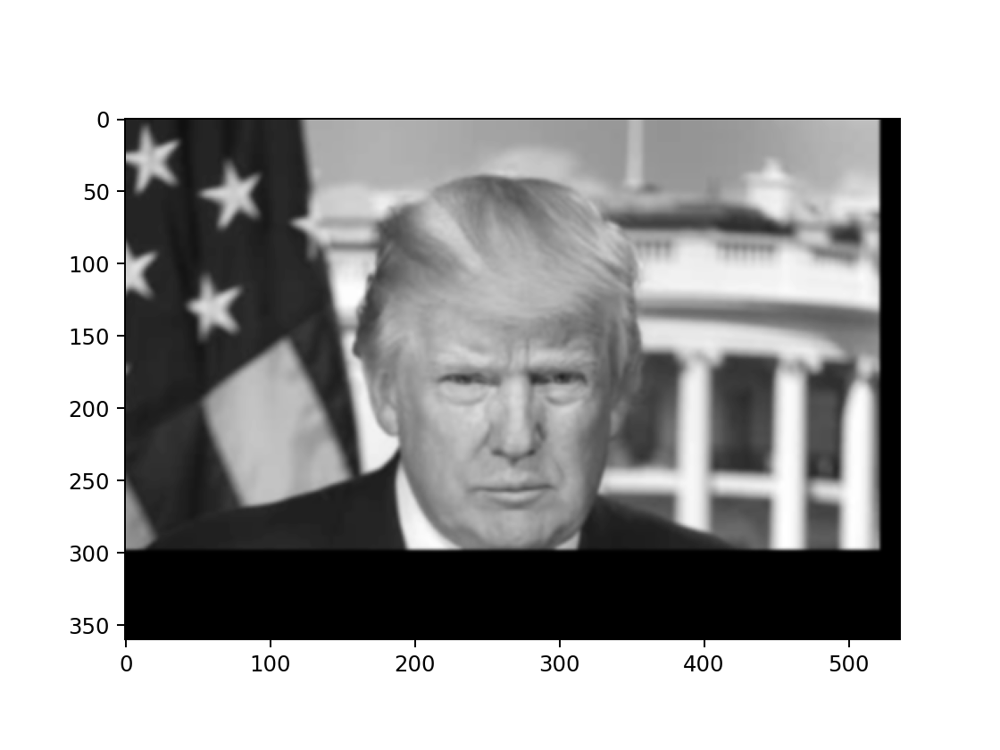

<IPython.core.display.Javascript object>


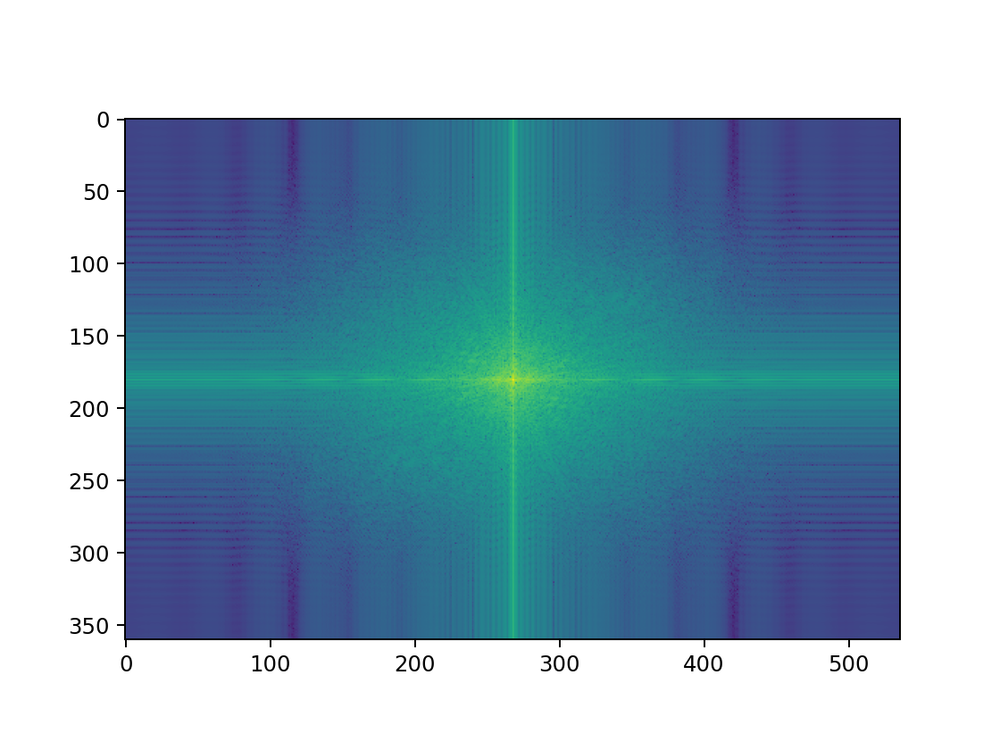

im2:


<IPython.core.display.Javascript object>


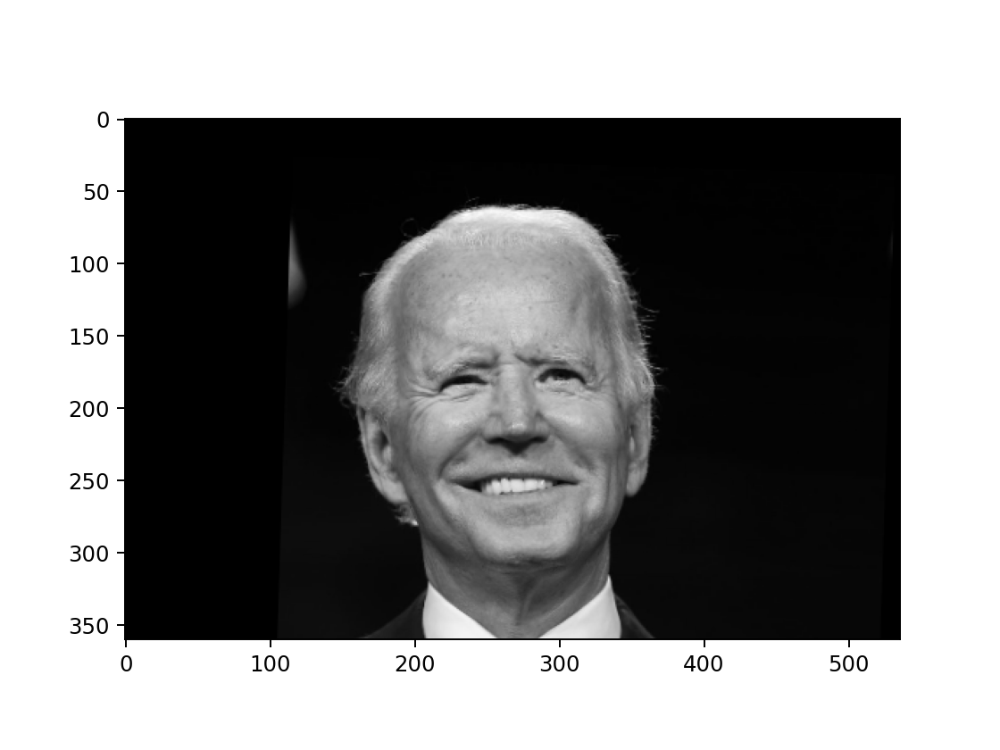

<IPython.core.display.Javascript object>


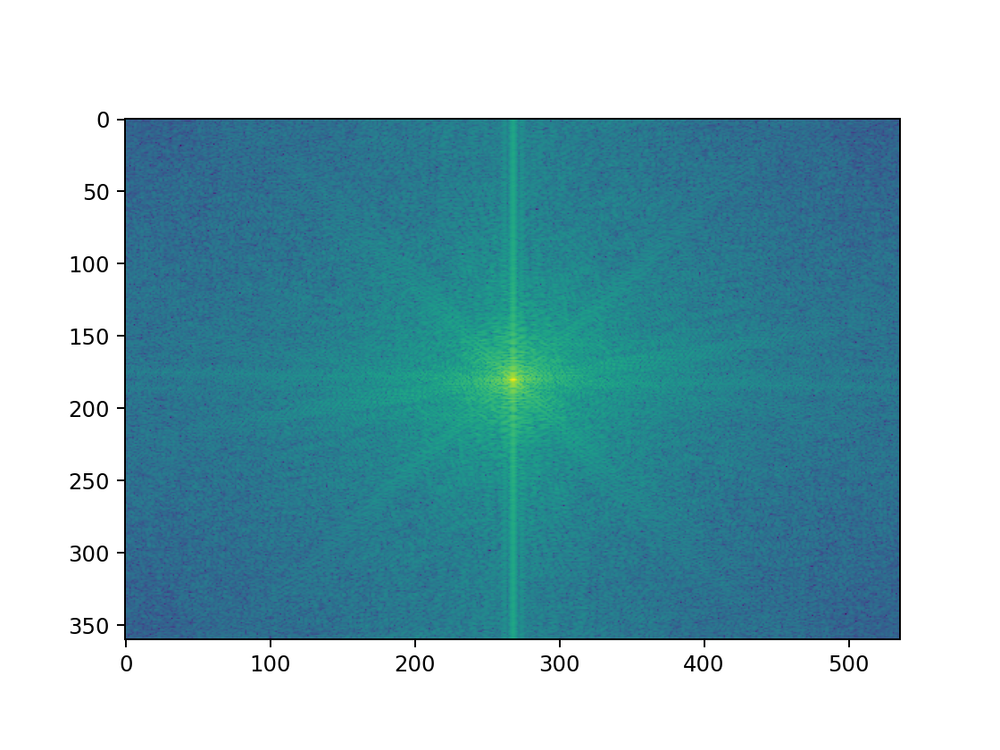

<IPython.core.display.Javascript object>


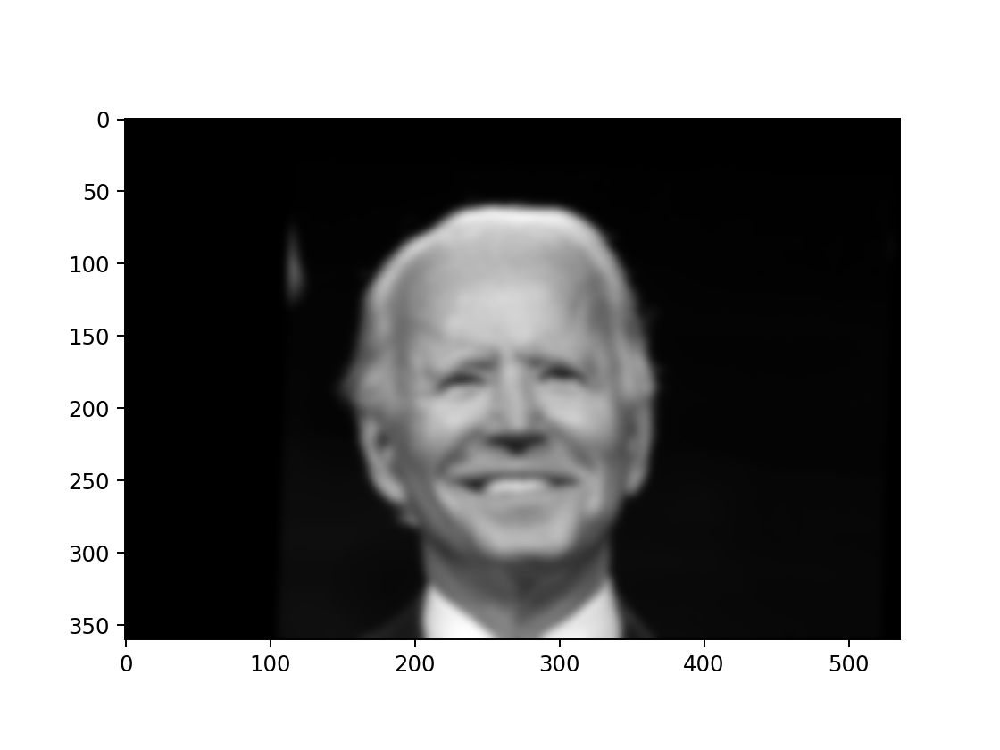

<IPython.core.display.Javascript object>


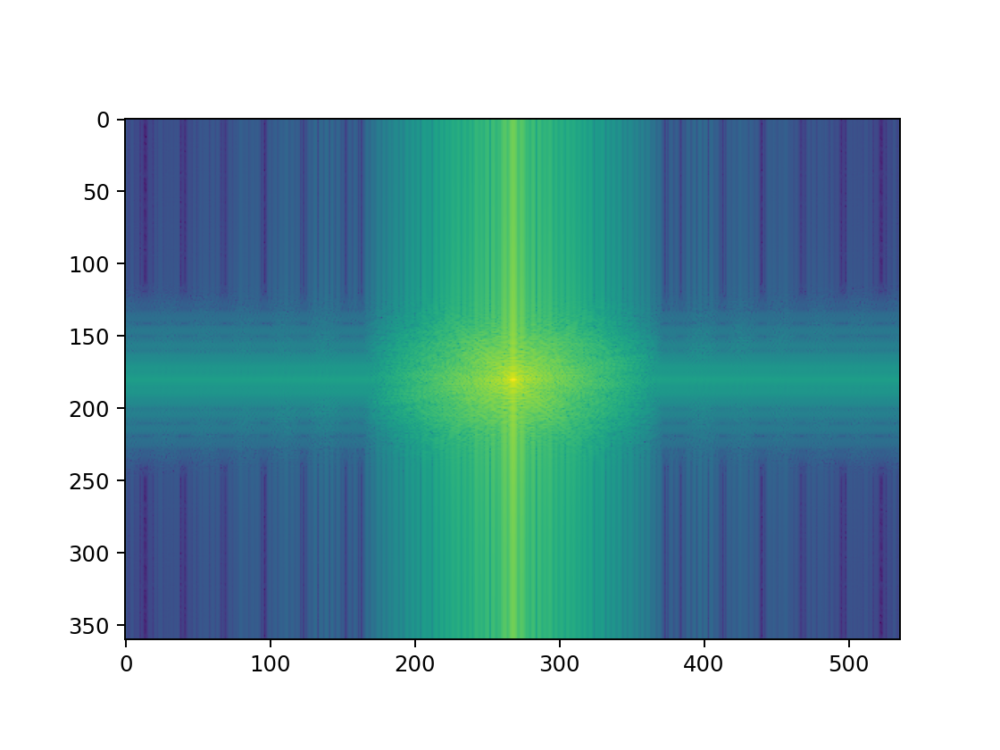

hybrid:


<IPython.core.display.Javascript object>


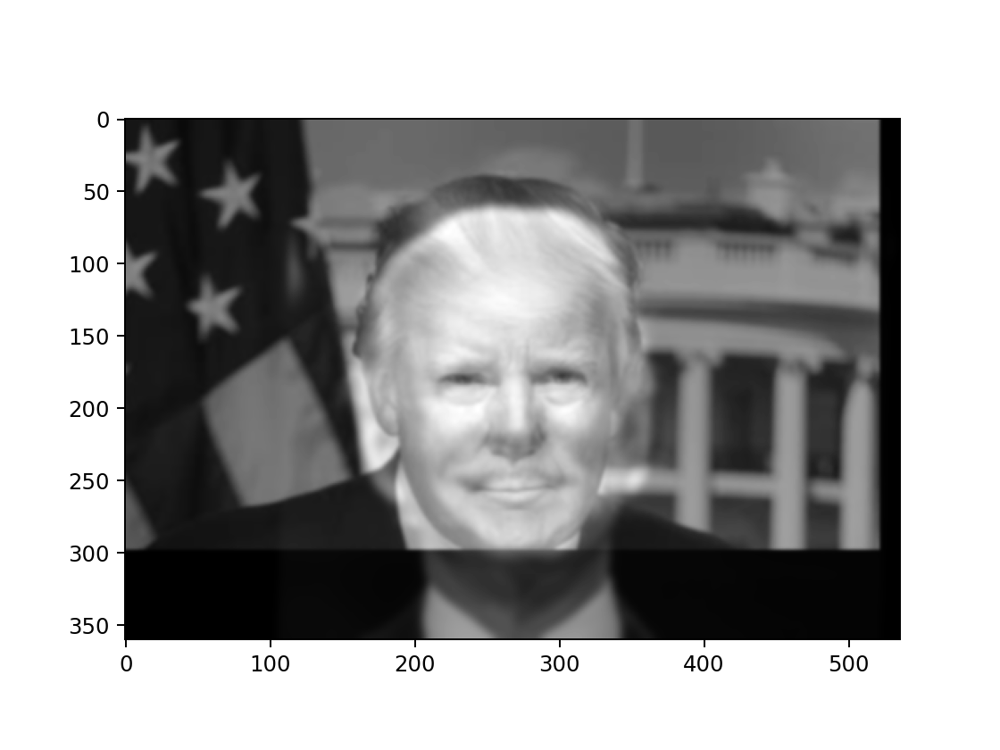

<IPython.core.display.Javascript object>


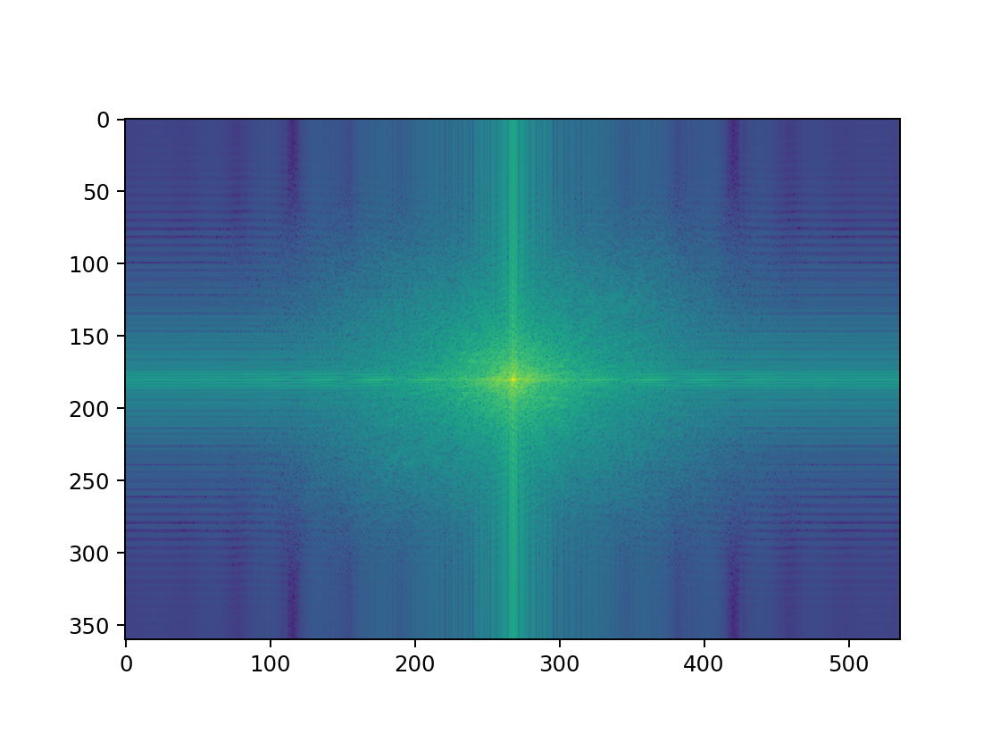

In [93]:
sigma_low = 1 # choose parameters that work for your images
sigma_high = 3

im_hybrid = hybridImage(im2, im1, sigma_low, sigma_high)


<IPython.core.display.Javascript object>


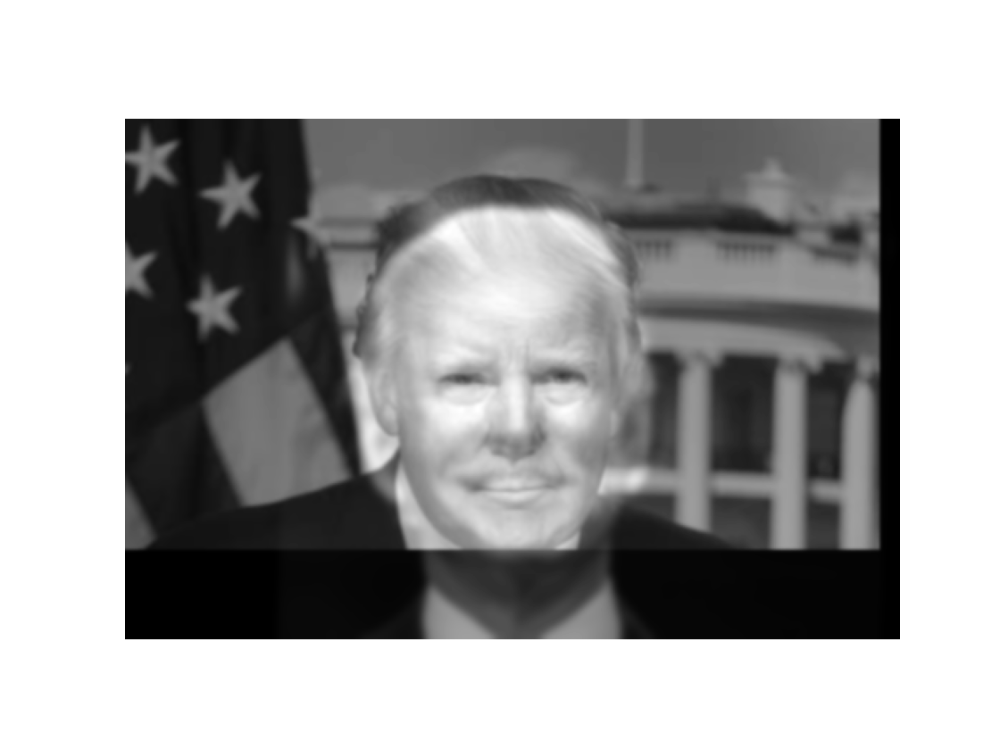

In [87]:
# Optional: Select top left corner and bottom right corner to crop image
# the function returns dictionary of 
# {
#   'cropped_image': np.ndarray of shape H x W
#   'crop_bound': np.ndarray of shape 2x2
# }
cropped_object = utils.interactive_crop(im_hybrid)

### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

In [13]:
from scipy import ndimage

<IPython.core.display.Javascript object>


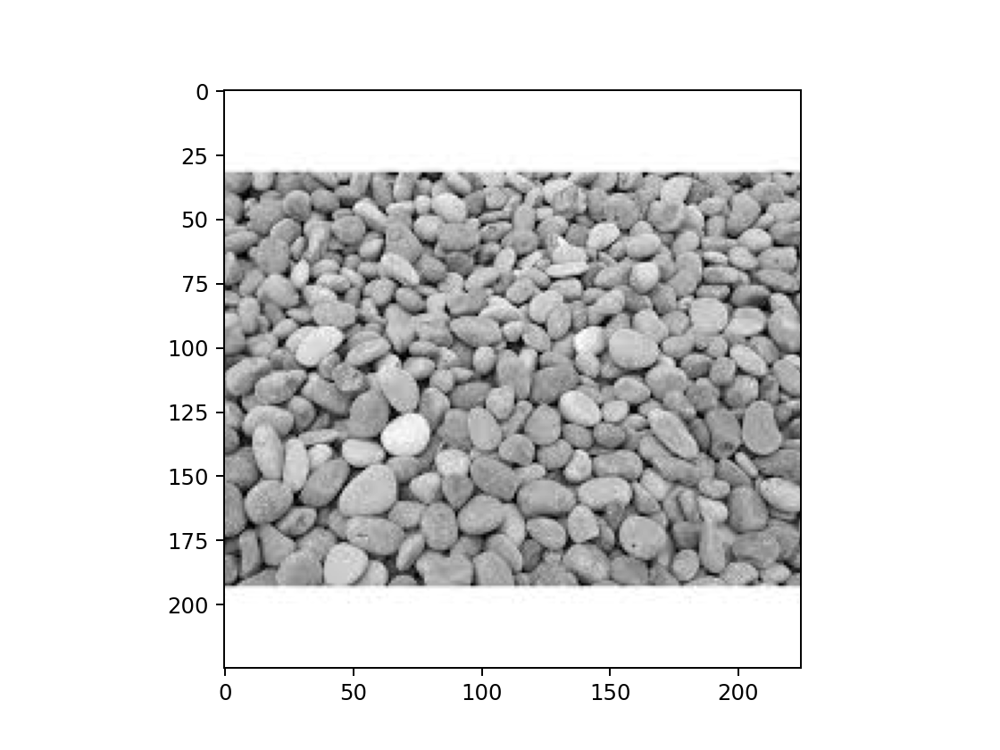

<IPython.core.display.Javascript object>


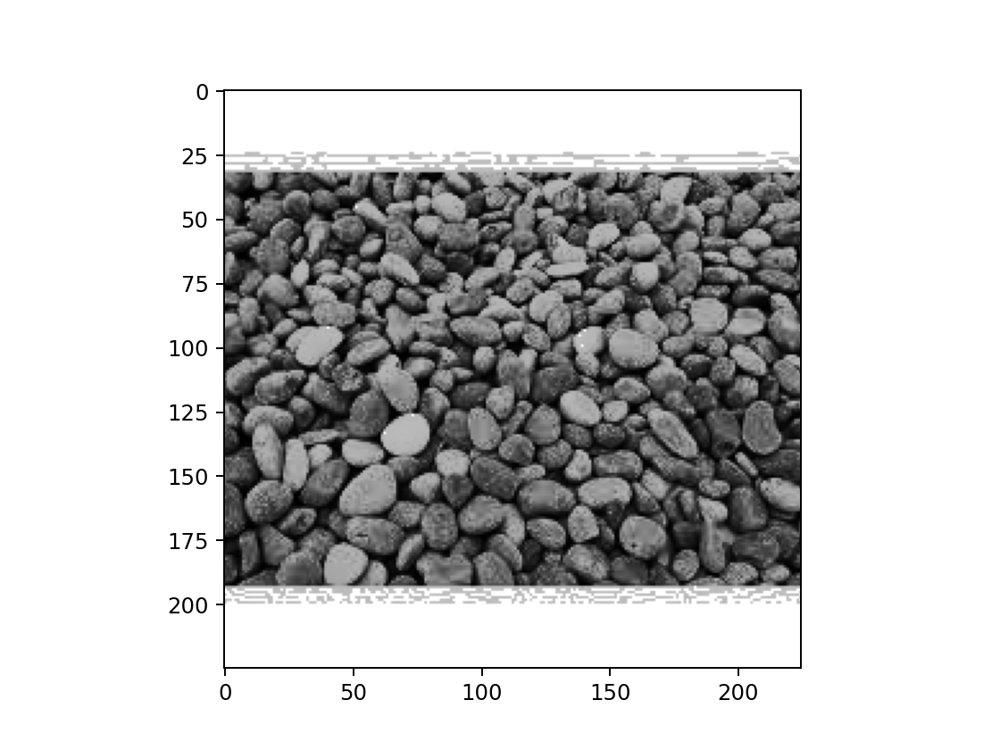

In [21]:
image_path = 'data/rock.jpeg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

image_eq = cv2.equalizeHist(image)
image_fil = ndimage.gaussian_filter(image_eq, sigma=0.3)

plt.figure()
plt.imshow(image, cmap='gray')

plt.figure()
plt.imshow(image_fil, cmap='gray')

#### Color enhancement 

<IPython.core.display.Javascript object>


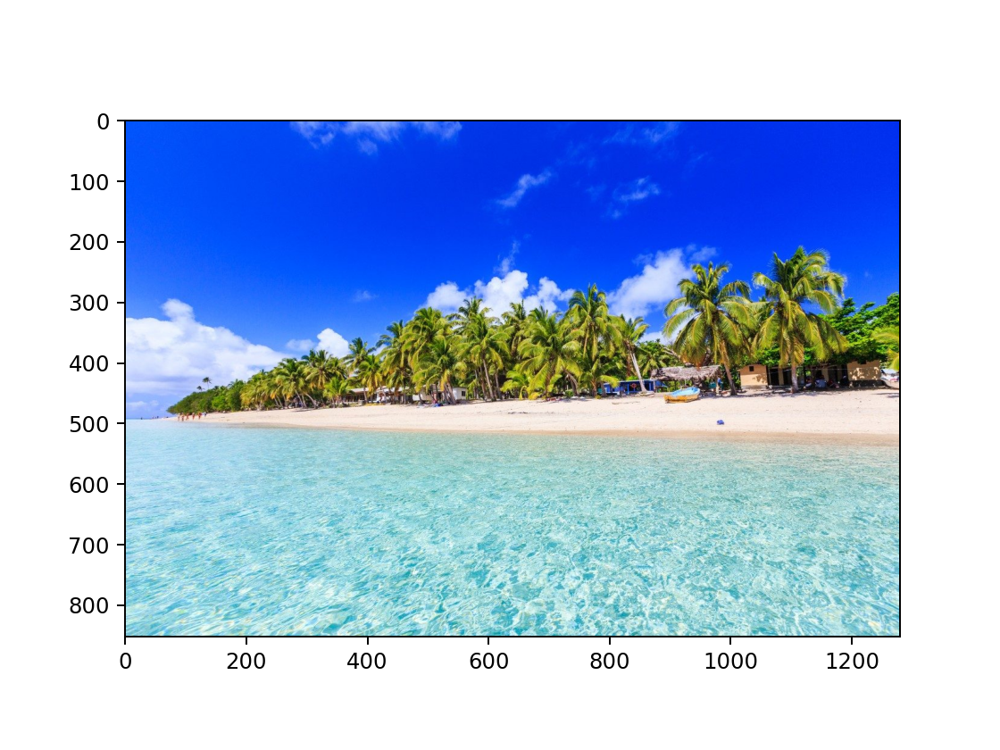

<IPython.core.display.Javascript object>


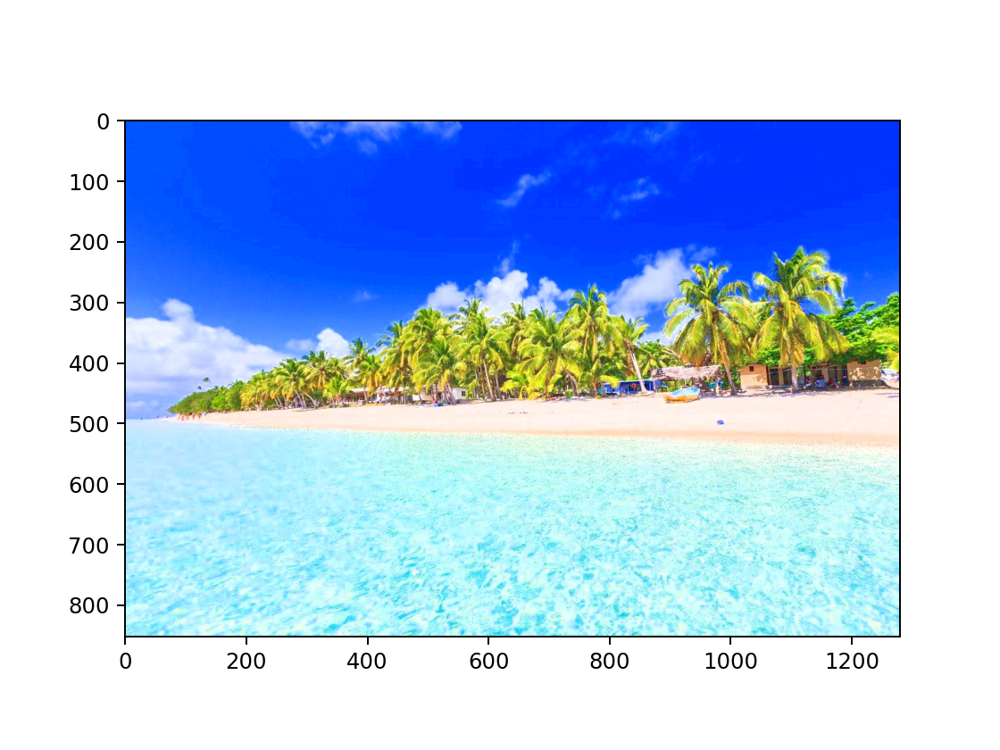

In [27]:
image_path2 = 'data/fiji.jpg'
image2 = cv2.imread(image_path2)
image2_in = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

hsv = cv2.cvtColor(image2, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)
lim = 255
threshold = 200

v[v > threshold] = lim
v[v < threshold] += lim - threshold
hsv = cv2.merge((h, s, v))
image_en = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

plt.figure()
plt.imshow(image2_in)
plt.figure()
plt.imshow(image_en)

#### Color shift

<IPython.core.display.Javascript object>


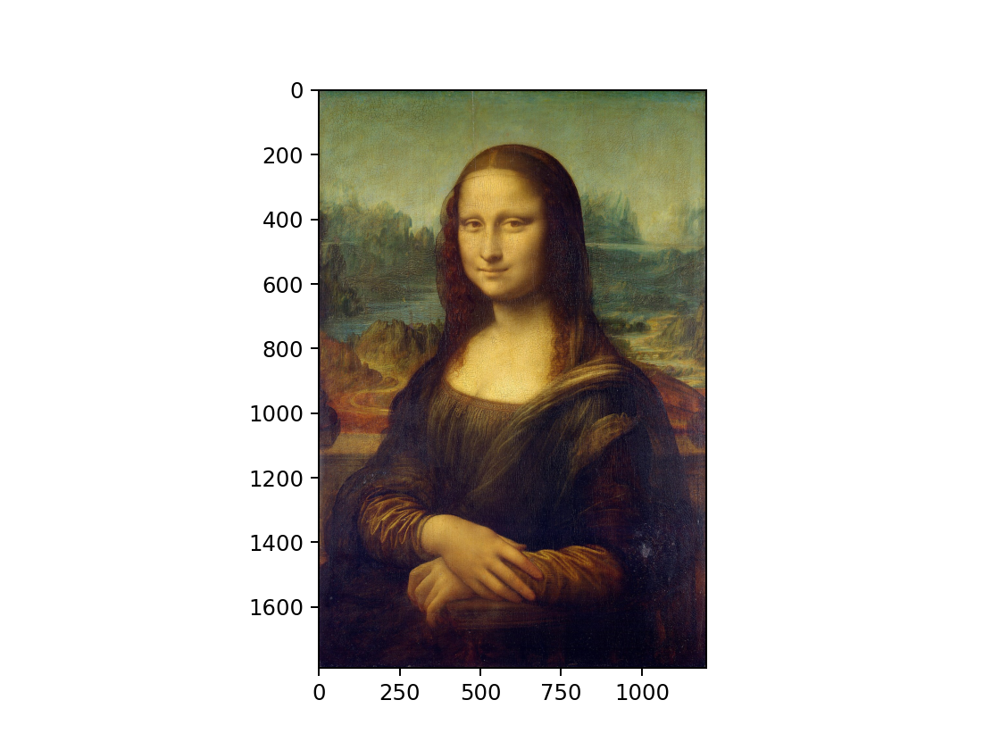

<IPython.core.display.Javascript object>


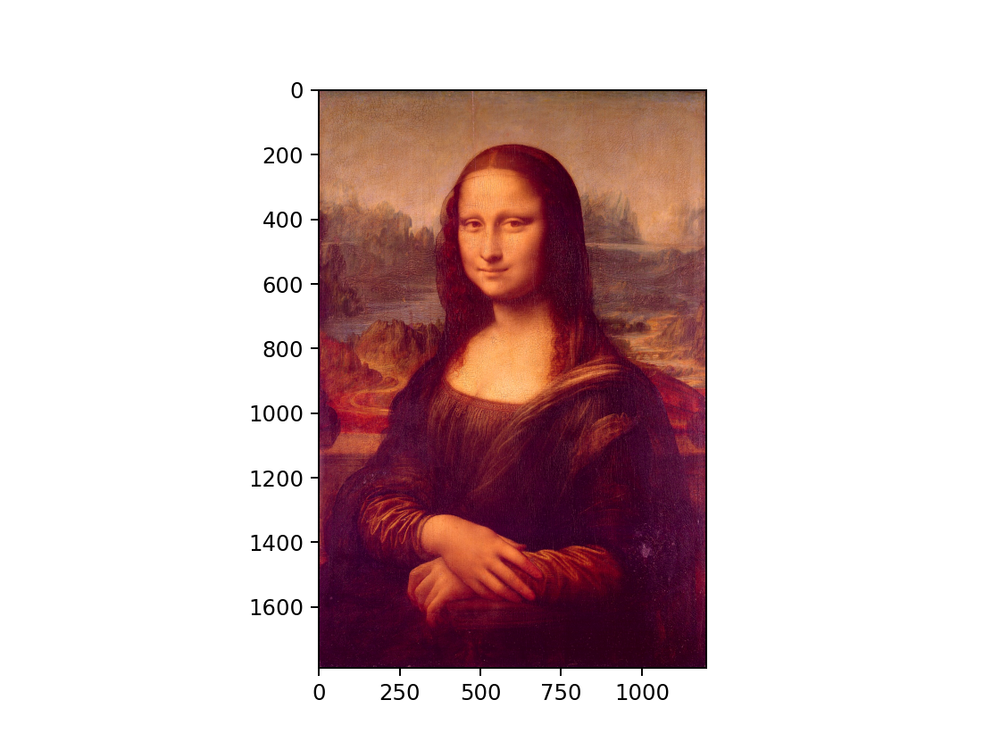

<IPython.core.display.Javascript object>


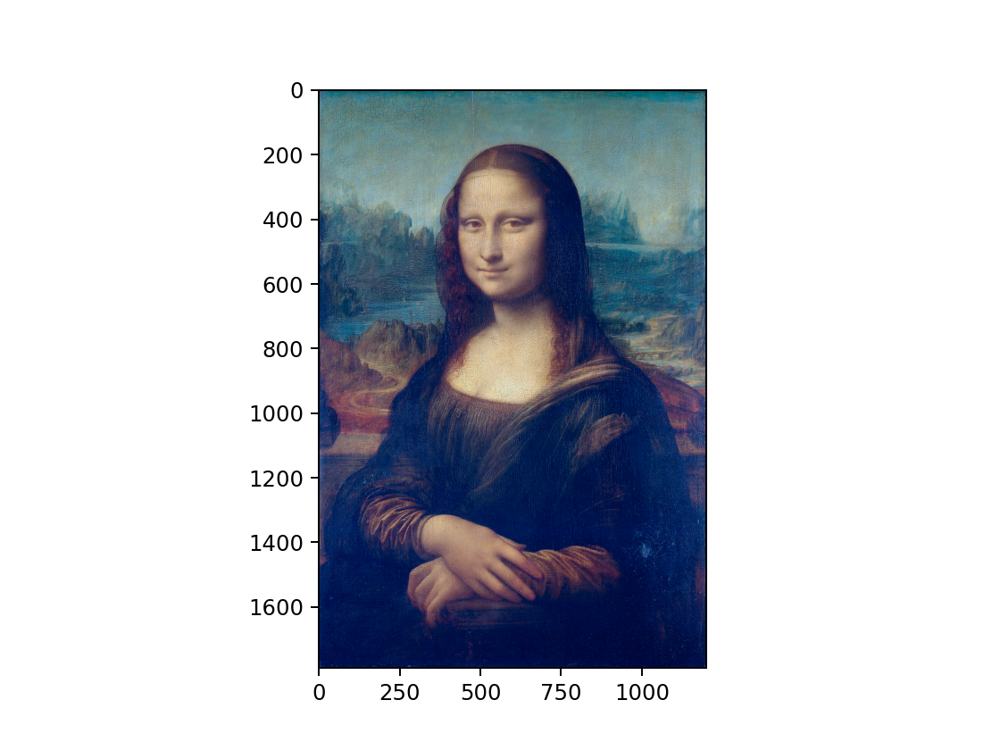

In [50]:
image_path3 = 'data/mona_lisa.jpg'
image3 = cv2.imread(image_path3)
image3_in = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)

lab = cv2.cvtColor(image3, cv2.COLOR_BGR2Lab)
step = 30

# more red
l, a, b = cv2.split(lab)
a += step

red = cv2.merge((l, a, b))
image_red = cv2.cvtColor(red, cv2.COLOR_LAB2RGB)

# more yellow

l, a, b = cv2.split(lab)
b -= step

yel = cv2.merge((l, a, b))
image_yel = cv2.cvtColor(yel, cv2.COLOR_LAB2RGB)

plt.figure()
plt.imshow(image3_in)
plt.figure()
plt.imshow(image_red)
plt.figure()
plt.imshow(image_yel)